# Project Proposal

### A.Predictive Modeling Discussion

#### a. Are you working on a REGRESSION or CLASSIFICATION problem? 

i will work on the classfication problem

#### b. Which variables are input 

for the classification model. i will use danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence and tempo as input

#### c. Which variables are output 

for the classification model. i will use track_popularity as output

#### d/e. Did you need to DERIVE the responses of interest by SUMMARIZING the available data?

yes, in my analysis, i displayed the relationship between count of different genres over release Year. Besides, for popularity analysis, i displayed the different popularity between different genres

#### f. Which variables are identifiers and should NOT be used in the models? 

track_id, track_name, track_album_id, track_album_name, playlist_name and playlist_id should be not in the model as they are categorical variables. they could be used by EDA purpose

#### i.	Which of the inputs do you think influence the response, based on your exploratory visualizations? Which exploratory visualization helped you identify potential input-to-output relationships? (If you are not sure which inputs seem to influence the response, it is okay to say so.)

from the plot we can see that 'danceability', 'energy', 'loudness','speechiness', 'acousticness', 'instrumentalness', 'liveness','valence', 'tempo', 'duration_ms' could be selected as the features as they are continuous data

### B.Exploratory Data Analysis

In [18]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [321]:
data_url = 'https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2020/2020-01-21/spotify_songs.csv'
df_raw = pd.read_csv(data_url)
pd.set_option('display.max_columns', None) 

In [331]:
df_raw.shape

(32833, 23)

In [332]:
df_raw.isnull().sum()

track_id                    0
track_name                  5
track_artist                5
track_popularity            0
track_album_id              0
track_album_name            5
track_album_release_date    0
playlist_name               0
playlist_id                 0
playlist_genre              0
playlist_subgenre           0
danceability                0
energy                      0
key                         0
loudness                    0
mode                        0
speechiness                 0
acousticness                0
instrumentalness            0
liveness                    0
valence                     0
tempo                       0
duration_ms                 0
dtype: int64

In [333]:
df_raw.nunique()

track_id                    28356
track_name                  23449
track_artist                10692
track_popularity              101
track_album_id              22545
track_album_name            19743
track_album_release_date     4530
playlist_name                 449
playlist_id                   471
playlist_genre                  6
playlist_subgenre              24
danceability                  822
energy                        952
key                            12
loudness                    10222
mode                            2
speechiness                  1270
acousticness                 3731
instrumentalness             4729
liveness                     1624
valence                      1362
tempo                       17684
duration_ms                 19785
dtype: int64

#### Remove duplicate and Null 

In [334]:
df_raw = df_raw.drop_duplicates()
df = df_raw.dropna()
df.isnull().sum()

track_id                    0
track_name                  0
track_artist                0
track_popularity            0
track_album_id              0
track_album_name            0
track_album_release_date    0
playlist_name               0
playlist_id                 0
playlist_genre              0
playlist_subgenre           0
danceability                0
energy                      0
key                         0
loudness                    0
mode                        0
speechiness                 0
acousticness                0
instrumentalness            0
liveness                    0
valence                     0
tempo                       0
duration_ms                 0
dtype: int64

### Comments:

After checking on the data briefly, i think track_popularity, key and duration_ms can be considered as non-numeric columns while they are numeric columns. For example:

* track_popularity: it is easier for people to understand how various factors influence popularity.
* key: based on the describtion of the key, it should be considered as categorical columns as well for analysis purpose.
* duration_ms: it might be more insightful to categorize into duration ranges like short, medium, long etc to see how it influence other attributes

### Marginal Distribution

### Categorical variables: Bar charts.

In [335]:
df_object = df.select_dtypes(include=['object']).copy()

In [336]:
df_object.describe()

,track_id,track_name,track_artist,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,playlist_subgenre
count,32828,32828,32828,32828,32828,32828,32828,32828,32828,32828
unique,28352,23449,10692,22543,19743,4529,449,471,6,24
top,7BKLCZ1jbUBVqRi2FVlTVw,Poison,Martin Garrix,5L1xcowSxwzFUSJzvyMp48,Greatest Hits,2020-01-10,Indie Poptimism,4JkkvMpVl4lSioqQjeAL0q,edm,progressive electro house
freq,10,22,161,42,139,270,308,247,6043,1809


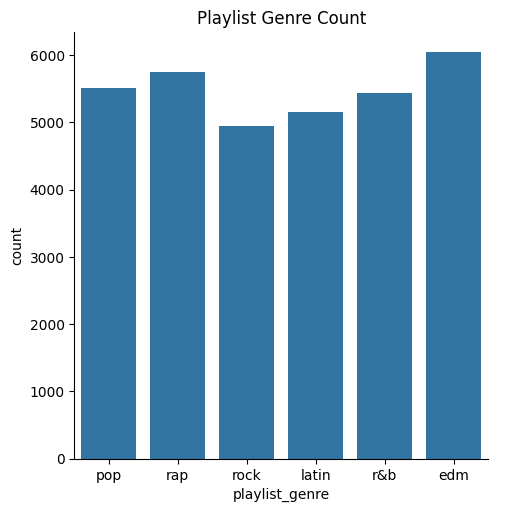

In [403]:
sns.catplot(data=df_object, x = "playlist_genre", kind='count')
plt.title('Playlist Genre Count' )
plt.show()

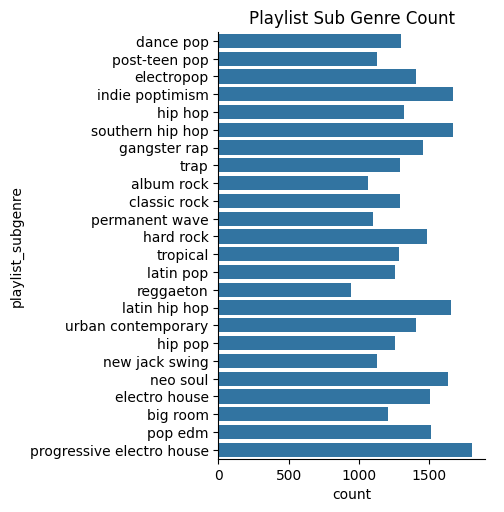

In [404]:
sns.catplot(data=df_object, y = "playlist_subgenre", kind='count')
plt.title('Playlist Sub Genre Count' )
plt.show()

In [405]:
df_object['track_artist'].value_counts()[df_object['track_artist'].value_counts() > 50].index

Index(['Martin Garrix', 'Queen', 'The Chainsmokers', 'David Guetta',
       'Don Omar', 'Drake', 'Dimitri Vegas & Like Mike', 'Calvin Harris',
       'Hardwell', 'Kygo', 'Guns N' Roses', 'The Weeknd', 'Avicii', 'J Balvin',
       'Maroon 5', 'Ed Sheeran', 'Major Lazer', 'Logic', 'Daddy Yankee',
       'Tiësto', '2Pac', 'DJ Snake', 'Wisin & Yandel', 'Bad Bunny',
       'Post Malone', 'Rihanna', 'Khalid', '50 Cent', 'Ozuna', 'Zedd', 'R3HAB',
       'Ariana Grande', 'Selena Gomez', 'Rick Ross', 'Eminem'],
      dtype='object', name='track_artist')

In [340]:
track_artist_list = df_object['track_artist'].value_counts()[df_object['track_artist'].value_counts() > 50].index
track_artist_more_than_50 = df_object[df_object['track_artist'].isin(track_artist_list)].copy()

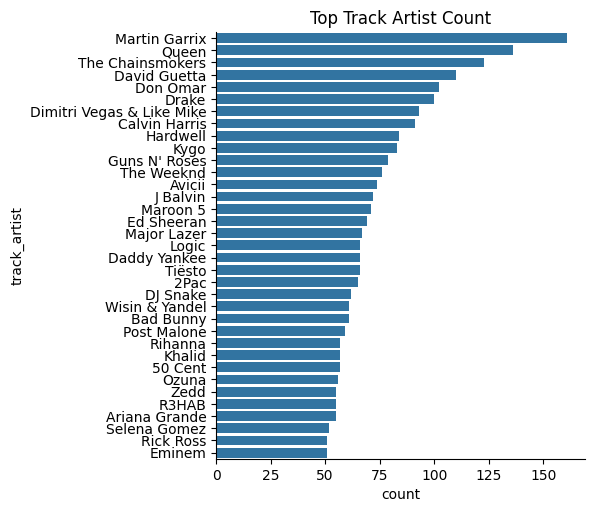

In [406]:
sns.catplot(data=track_artist_more_than_50, y ="track_artist" , kind = "count", aspect = 1.2, order = track_artist_list)
plt.title('Top Track Artist Count' )
plt.show()

In [342]:
df_object['playlist_name'].value_counts()[df_object['playlist_name'].value_counts() >100].index

Index(['Indie Poptimism', '2020 Hits & 2019  Hits – Top Global Tracks 🔥🔥🔥',
       'Permanent Wave', 'Hard Rock Workout',
       'Ultimate Indie Presents... Best Indie Tracks of the 2010s',
       'Fitness Workout Electro | House | Dance | Progressive House',
       'Charts 2020 🔥Top 2020🔥Hits 2020🔥Summer 2020🔥Pop 2020🔥Popular Music🔥Clean Pop 2020🔥Sing Alongs',
       'Southern Hip Hop',
       'Classic Rock 70s 80s 90s, Rock Classics - 70s Rock, 80s Rock, 90s Rock Rock  Classicos',
       'Urban Contemporary', 'post teen pop', 'permanent wave', 'Dance Pop',
       'New Jack Swing', 'Urban contemporary', 'Tropical Vibes',
       'EDM 2020 House & Dance', 'Gangsta Rap/90's Hip-Hop'],
      dtype='object', name='playlist_name')

In [343]:
playlist_name_list = df_object['playlist_name'].value_counts()[df_object['playlist_name'].value_counts() > 100].index
playlist_name_more_than_100 = df_object[df_object['playlist_name'].isin(playlist_name_list)].copy()

/opt/miniconda3/lib/python3.12/site-packages/seaborn/axisgrid.py:123: UserWarning: Glyph 128293 (\N{FIRE}) missing from current font.
  self._figure.tight_layout(*args, **kwargs)
/opt/miniconda3/lib/python3.12/site-packages/seaborn/axisgrid.py:123: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
/opt/miniconda3/lib/python3.12/site-packages/seaborn/utils.py:61: UserWarning: Glyph 128293 (\N{FIRE}) missing from current font.
  fig.canvas.draw()
/opt/miniconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 128293 (\N{FIRE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


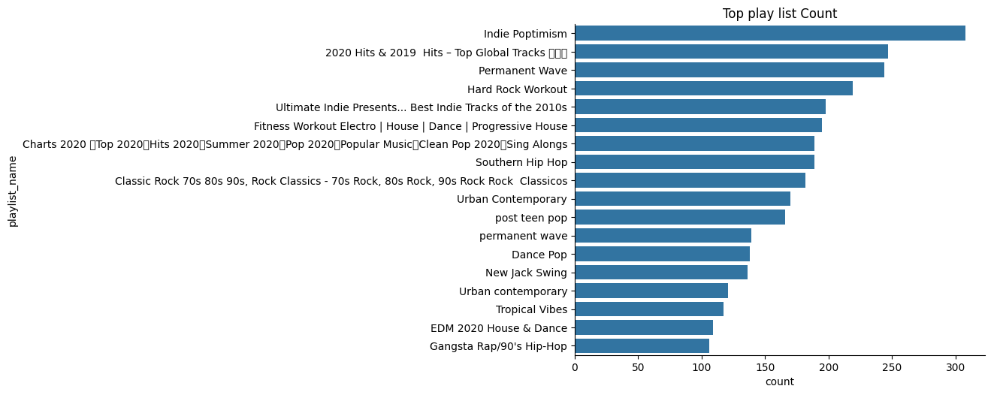

In [407]:
sns.catplot(data=playlist_name_more_than_100, y ="playlist_name" , kind = "count", aspect = 1.2, order = playlist_name_list)
plt.title('Top play list Count' )
plt.show()

In [345]:
pd.to_datetime( df.track_album_release_date[:3] )

0   2019-06-14
1   2019-12-13
2   2019-07-05
Name: track_album_release_date, dtype: datetime64[ns]

In [346]:
df_object_cp = df_object.copy()
df_object_cp['track_album_release_date_dt'] = pd.to_datetime( df.track_album_release_date, errors='coerce' )

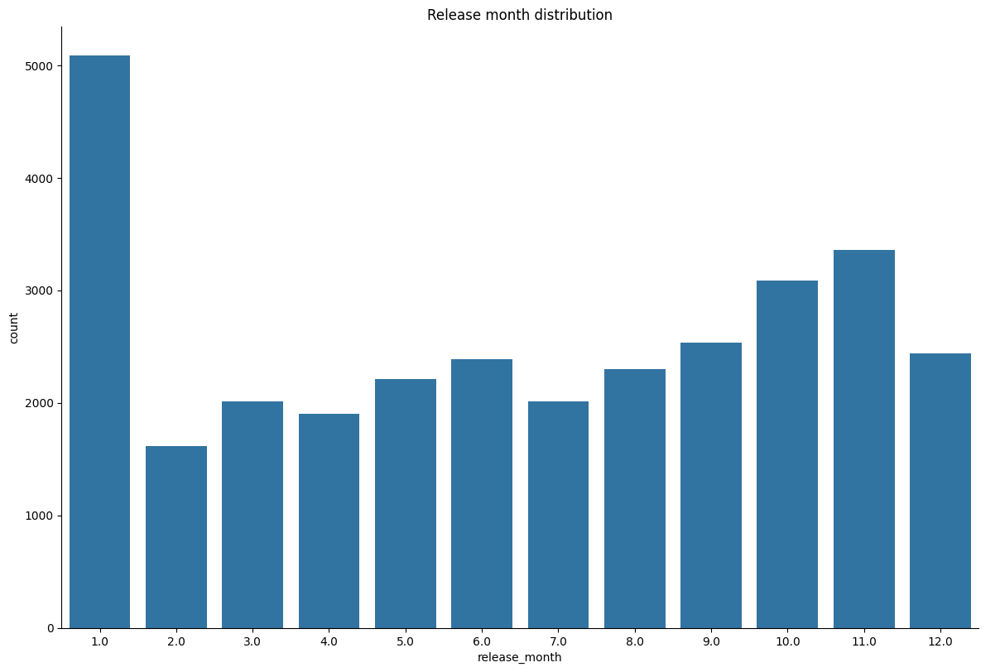

In [408]:
df_object_cp['release_year'] = df_object_cp.track_album_release_date_dt.dt.year
df_object_cp['release_month'] = df_object_cp.track_album_release_date_dt.dt.month
sns.catplot(data = df_object_cp, x='release_month', kind='count', height=8, aspect=1.5)
plt.title('Release month distribution' )
plt.show()

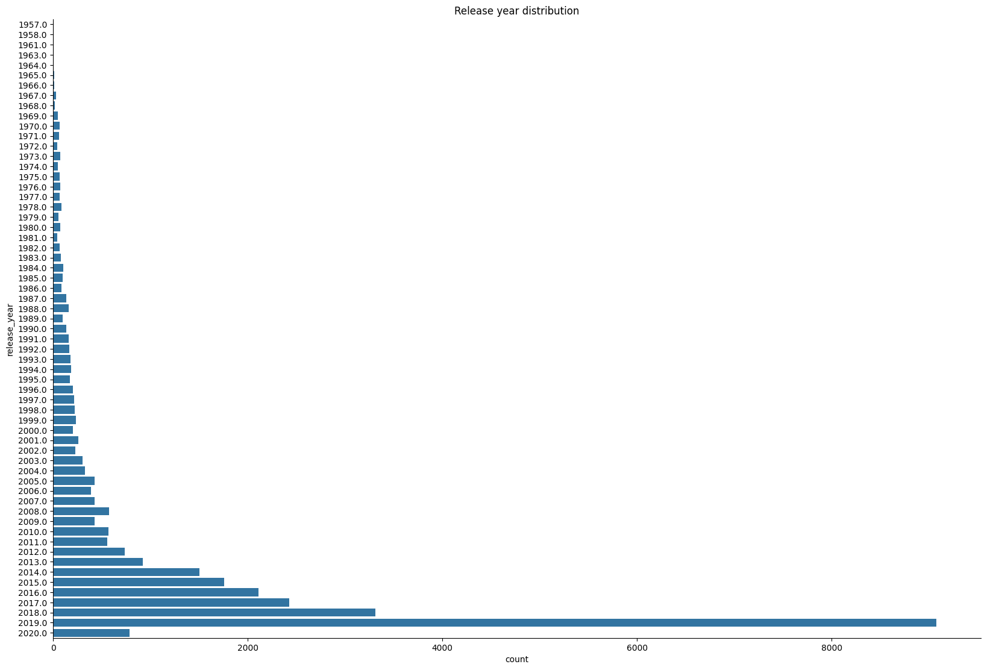

In [410]:
sns.catplot(data = df_object_cp, y='release_year', kind='count', height=11, aspect=1.5)
plt.title('Release year distribution' )
plt.show()

### Continuous variables: Histograms or density plots.

In [350]:
df_numeric = df.select_dtypes(include=['float64','int64']).copy()
df_numeric.describe()

,track_popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
count,32828.000000,32828.000000,32828.000000,32828.000000,32828.000000,32828.000000,32828.000000,32828.000000,32828.000000,32828.000000,32828.000000,32828.000000,32828.000000
mean,42.483551,0.654850,0.698603,5.373949,-6.719529,0.565737,0.107053,0.175352,0.084760,0.190175,0.510556,120.883642,225796.829779
std,24.980476,0.145092,0.180916,3.611572,2.988641,0.495667,0.101307,0.219644,0.224245,0.154313,0.233152,26.903632,59836.492346
min,0.000000,0.000000,0.000175,0.000000,-46.448000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4000.000000
25%,24.000000,0.563000,0.581000,2.000000,-8.171250,0.000000,0.041000,0.015100,0.000000,0.092700,0.331000,99.961000,187804.500000
50%,45.000000,0.672000,0.721000,6.000000,-6.166000,1.000000,0.062500,0.080400,0.000016,0.127000,0.512000,121.984000,216000.000000
75%,62.000000,0.761000,0.840000,9.000000,-4.645000,1.000000,0.132000,0.255000,0.004830,0.248000,0.693000,133.918250,253581.250000
max,100.000000,0.983000,1.000000,11.000000,1.275000,1.000000,0.918000,0.994000,0.994000,0.996000,0.991000,239.440000,517810.000000


In [351]:
df_numeric.head(3)

,track_popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,66,0.748,0.916,6,-2.634,1,0.0583,0.1020,0.000000,0.0653,0.518,122.036,194754
1,67,0.726,0.815,11,-4.969,1,0.0373,0.0724,0.004210,0.3570,0.693,99.972,162600
2,70,0.675,0.931,1,-3.432,0,0.0742,0.0794,0.000023,0.1100,0.613,124.008,176616


In [352]:
lf = df_numeric.reset_index().rename(columns={'index': 'rowid'}).melt(id_vars=['rowid'])
lf.head(5)

,rowid,variable,value
0,0,track_popularity,66.0
1,1,track_popularity,67.0
2,2,track_popularity,70.0
3,3,track_popularity,60.0
4,4,track_popularity,69.0


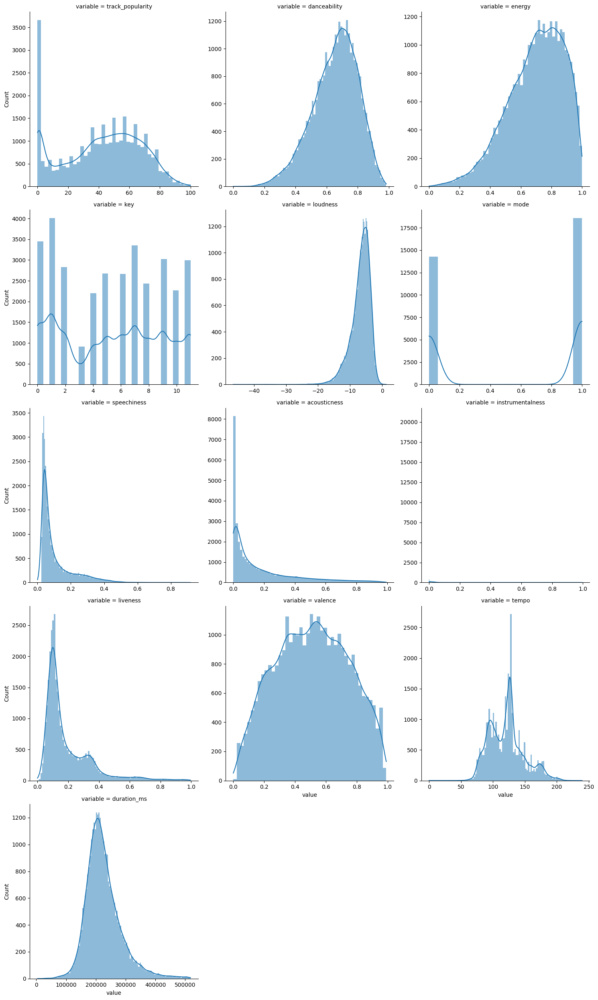

In [353]:
sns.displot(data = lf, x='value', col='variable', kind='hist', kde=True, col_wrap=3,
            facet_kws={'sharex': False, 'sharey': False},
            common_bins=False,)

plt.show()

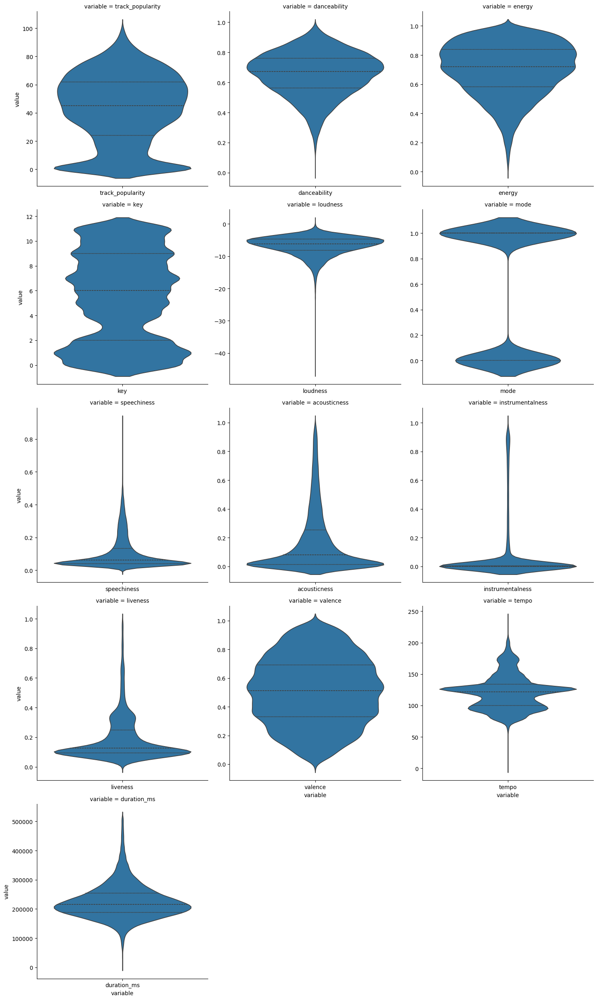

In [354]:
sns.catplot(data=lf, x='variable', y='value', kind='violin', col='variable', 
             col_wrap=3, inner='quartile', sharex=False, sharey=False)
plt.show()

### Categorical-Categorical Relationships

Text(0.5, 1.0, 'Release Year 2019 Artist Rank')

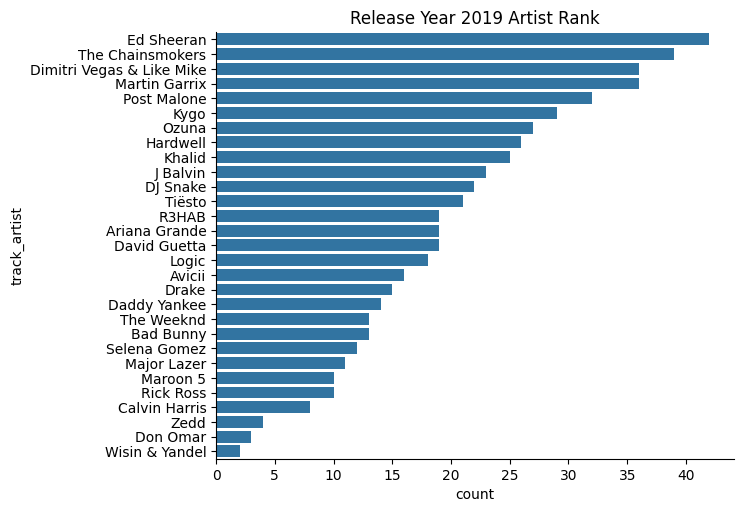

In [355]:
sns.catplot(data=(df_object_cp[(df_object_cp['release_year'] == 2019) & (df_object_cp['track_artist'].isin(track_artist_list))]
    .groupby('track_artist')
    .size()
    .reset_index(name='count')
    .sort_values(by='count', ascending=False)), y='track_artist', x='count', kind='bar', aspect=1.5)
plt.title('Release Year 2019 Artist Rank' )

Text(0.5, 1.0, 'Count of Genres by Release Year (Post-2000)')

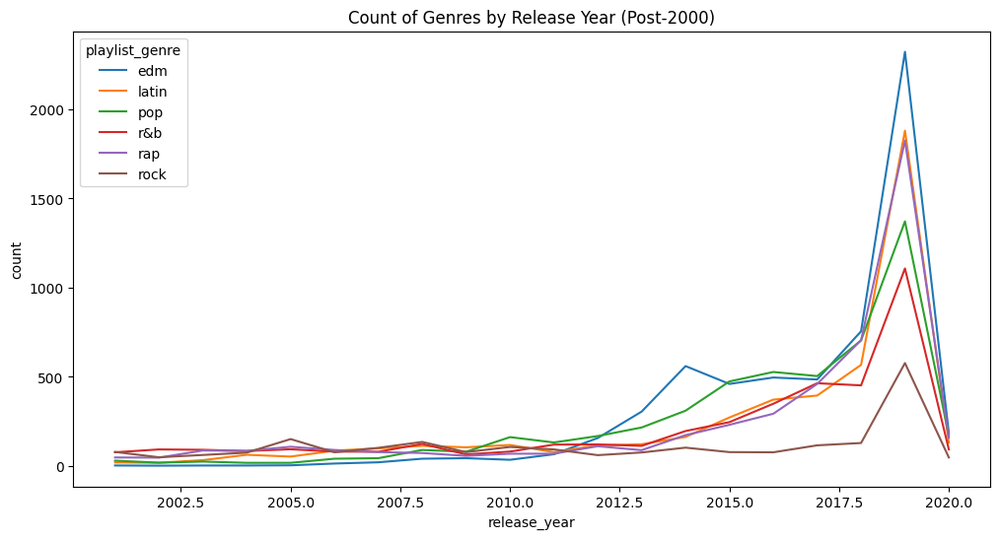

In [356]:
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_object_cp[df_object_cp['release_year'] > 2000]
    .groupby(['release_year', 'playlist_genre'])
    .size()
    .reset_index(name='count'), x='release_year', y='count', hue='playlist_genre')
plt.title('Count of Genres by Release Year (Post-2000)')

### Categorical to Continuous Relationships

In [357]:
df.track_popularity.describe()

count    32828.000000
mean        42.483551
std         24.980476
min          0.000000
25%         24.000000
50%         45.000000
75%         62.000000
max        100.000000
Name: track_popularity, dtype: float64

In [358]:
bins = [0, 20, 40, 60, 80, 100]
labels = ['Very Low', 'Low', 'Medium', 'High', 'Very High'] 
df['popularity_category'] = pd.cut(df['track_popularity'], bins=bins, labels=labels, right=True)

/var/folders/w0/mq47wjdx2mzfmj9hxn2r_4ch0000gn/T/ipykernel_36190/581698793.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['popularity_category'] = pd.cut(df['track_popularity'], bins=bins, labels=labels, right=True)


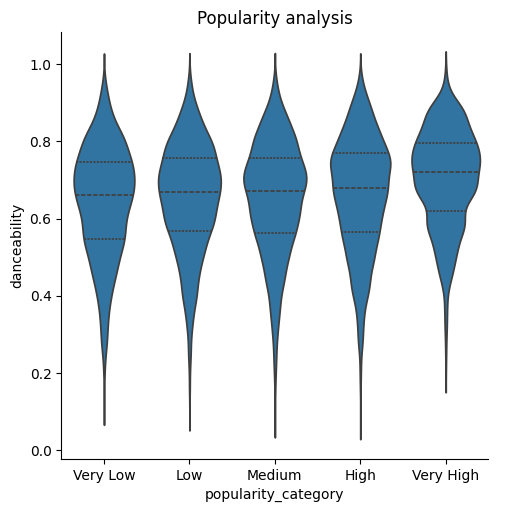

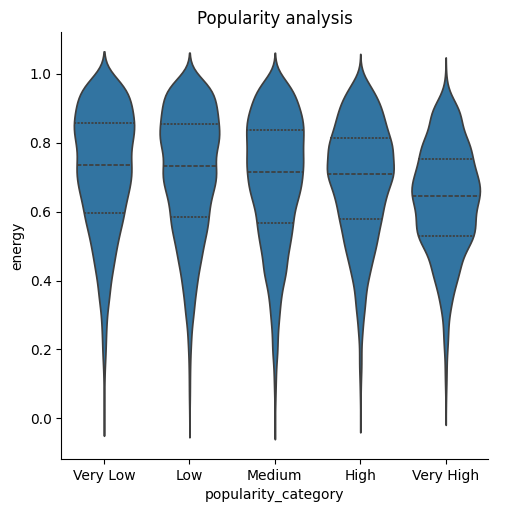

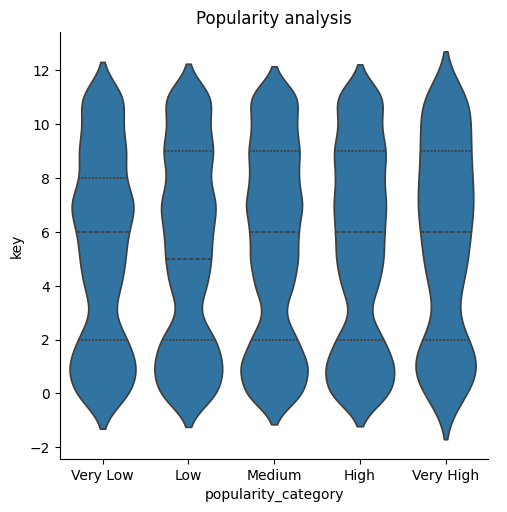

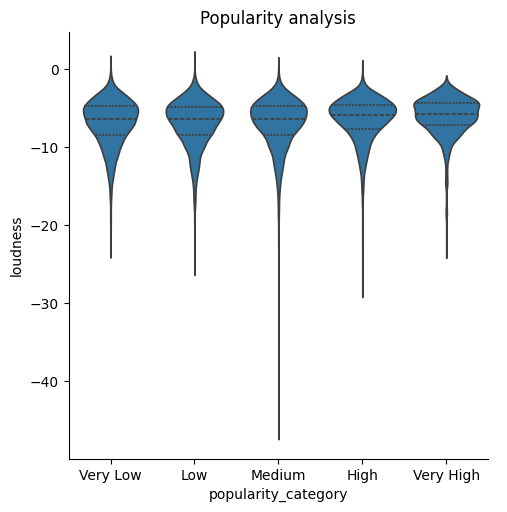

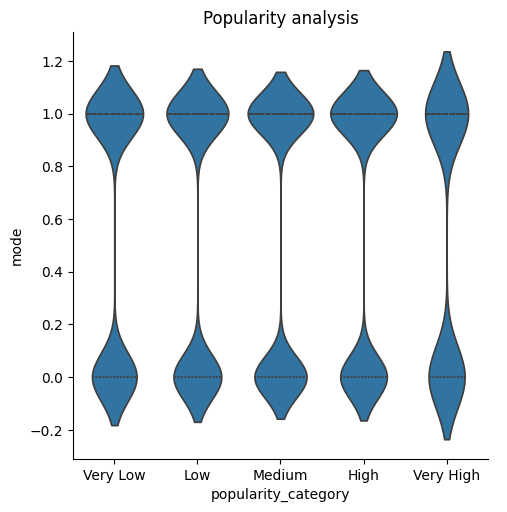

...

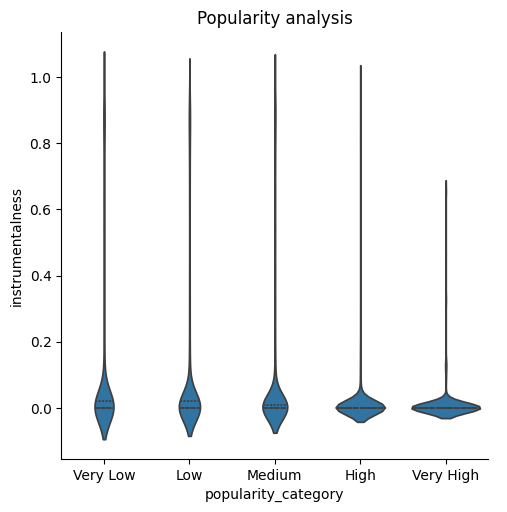

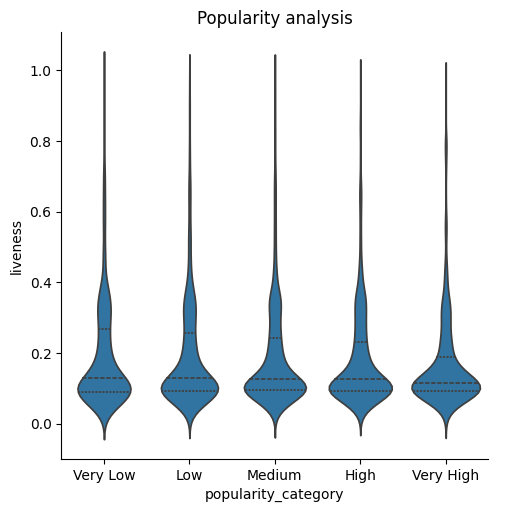

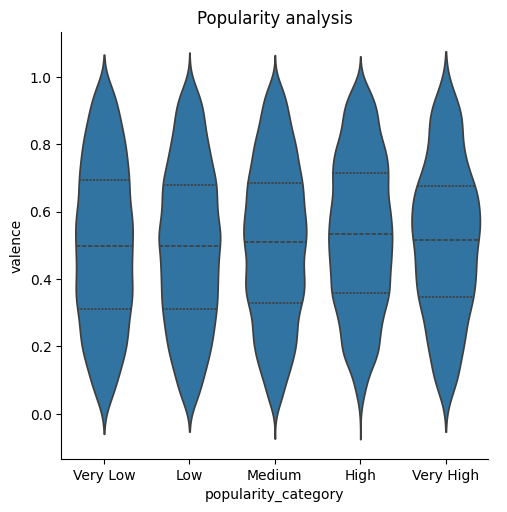

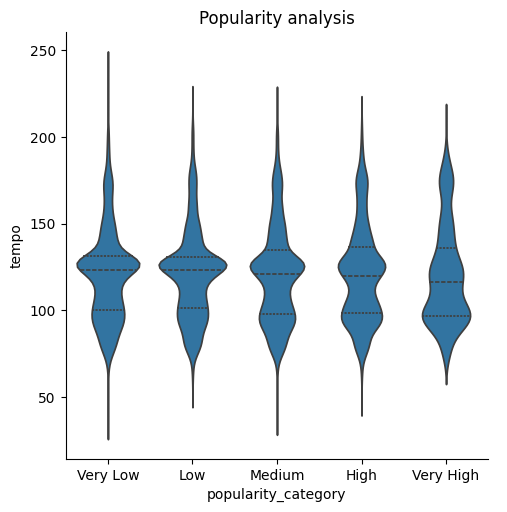

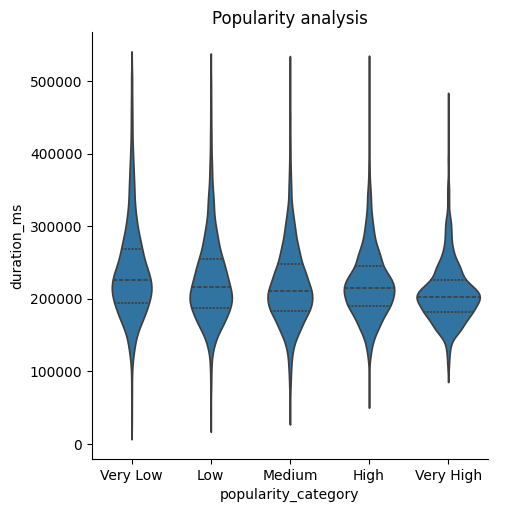

In [414]:
y_list = ['danceability', 'energy', 'key', 'loudness', 'mode',
        'speechiness', 'acousticness', 'instrumentalness', 'liveness',
        'valence', 'tempo', 'duration_ms']
for i in y_list:
    sns.catplot(data=df, x='popularity_category', y=i, kind ="violin",inner='quartile')
    plt.title('Popularity analysis')
    plt.show()

/var/folders/w0/mq47wjdx2mzfmj9hxn2r_4ch0000gn/T/ipykernel_36190/3307711320.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sns.catplot(data=df.groupby(['popularity_category','playlist_genre'])


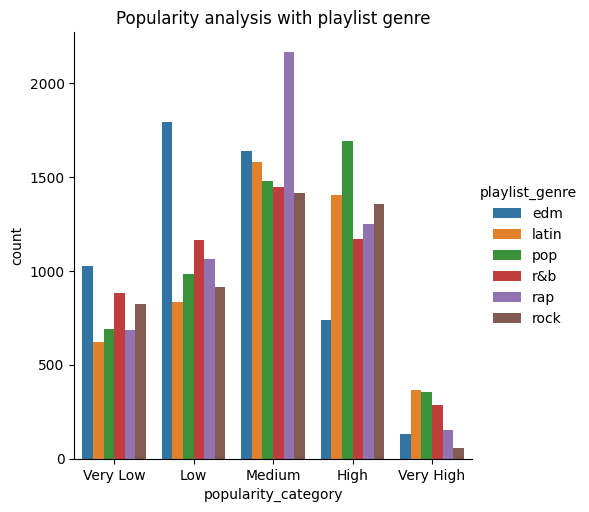

In [415]:
sns.catplot(data=df.groupby(['popularity_category','playlist_genre'])
            .size()
            .reset_index(name='count'), x='popularity_category', y='count',hue ="playlist_genre", kind='bar')
plt.title('Popularity analysis with playlist genre')
plt.show()

### Continuous-to-continuous relationships.

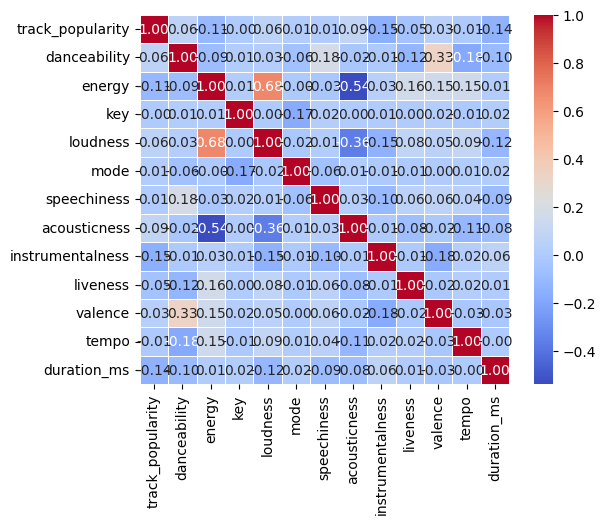

In [365]:
correlation_matrix = df_numeric.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', square=True, linewidths=0.5)
plt.show()

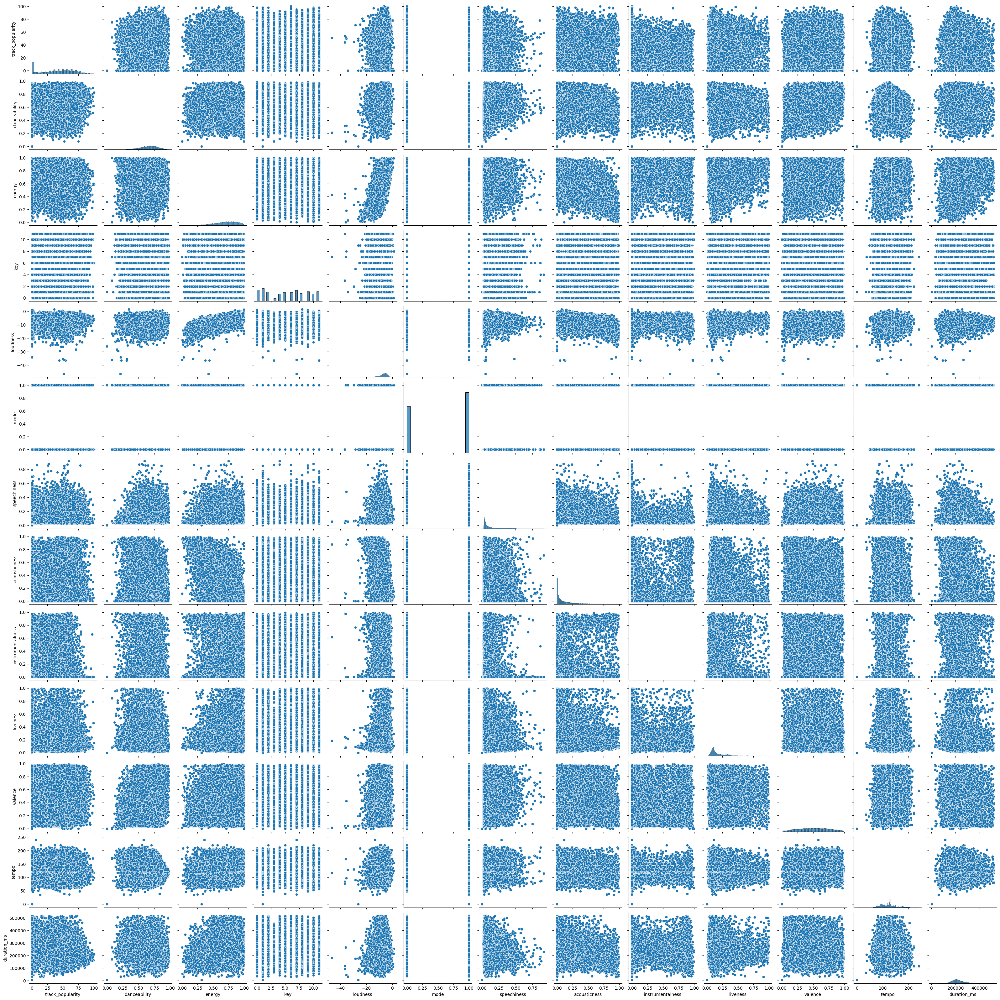

In [375]:
sns.pairplot(data = df_numeric)
plt.show()

<Figure size 1200x600 with 0 Axes>

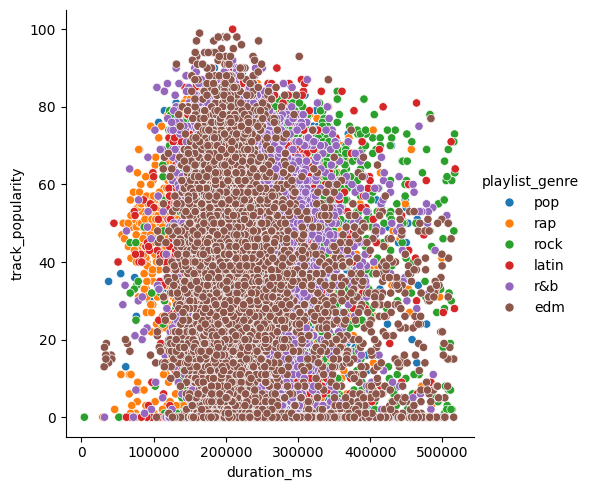

In [376]:
plt.figure(figsize=(12, 6))
sns.relplot(data=df, x='duration_ms', y='track_popularity', hue='playlist_genre')

## Cluster Analysis

#### Cluster inputs: danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo

#### Cluster outputs: track_popularity

In [377]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

In [378]:
df_analysis = df.select_dtypes(include=['float64', 'int64']).drop(columns=["key", "mode"]).copy()
features = df_analysis.drop(columns=["track_popularity"])
target = df_analysis.track_popularity
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

/var/folders/w0/mq47wjdx2mzfmj9hxn2r_4ch0000gn/T/ipykernel_36190/3462106688.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['cluster'] = kmeans.fit_predict(features_scaled)


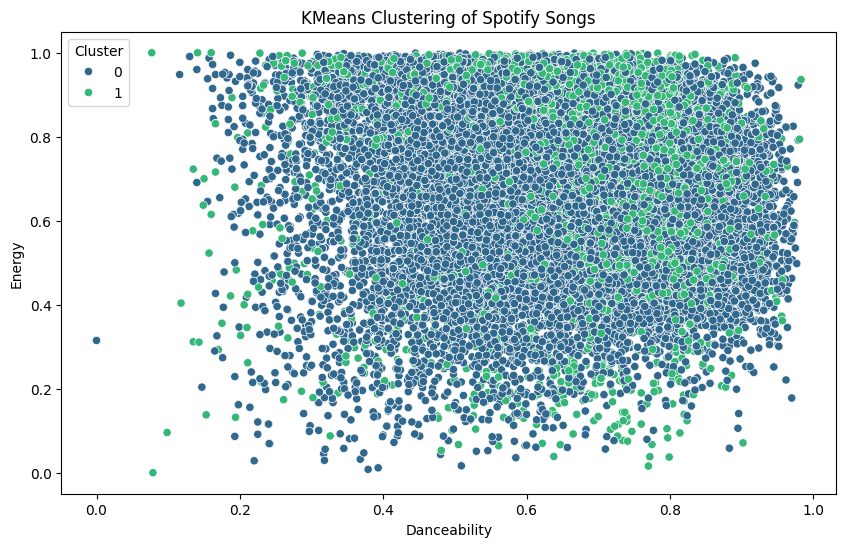

In [379]:
kmeans = KMeans(n_clusters=2, random_state=42)
df['cluster'] = kmeans.fit_predict(features_scaled)

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='danceability', y='energy', hue='cluster', palette='viridis')
plt.title('KMeans Clustering of Spotify Songs')
plt.xlabel('Danceability')
plt.ylabel('Energy')
plt.legend(title='Cluster')
plt.show()

### Select the optimal clusters

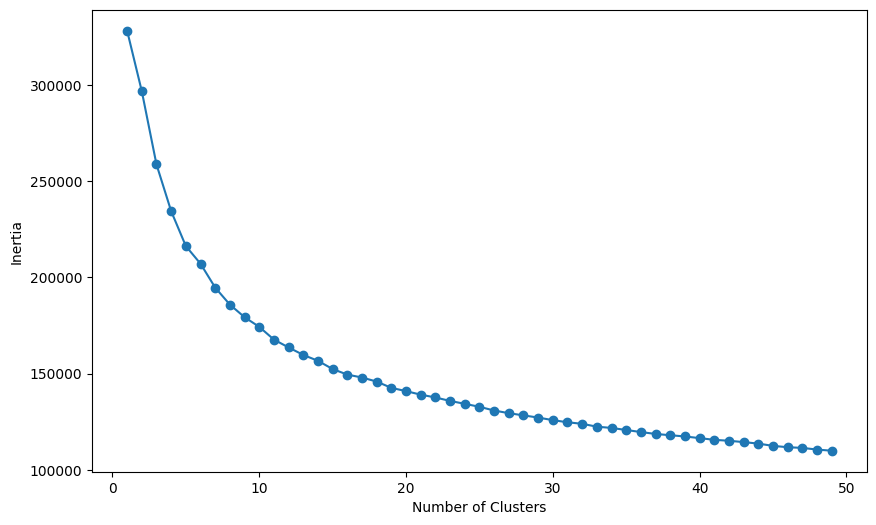

In [380]:
inertia = []
for i in range(1, 50):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(features_scaled)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(range(1, 50), inertia, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.show()


In [381]:
kmeans = KMeans(n_clusters=20, random_state=42)
df['cluster'] = kmeans.fit_predict(features_scaled)

/var/folders/w0/mq47wjdx2mzfmj9hxn2r_4ch0000gn/T/ipykernel_36190/2372449618.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['cluster'] = kmeans.fit_predict(features_scaled)


In [395]:
cluster_counts = df['cluster'].value_counts()
print(cluster_counts)

cluster
2     4344
0     3217
19    2777
13    2232
16    2230
14    1751
15    1718
6     1624
12    1561
8     1498
4     1427
10    1401
5     1222
11    1143
18    1090
9     1087
3      770
7      664
1      547
17     525
Name: count, dtype: int64


<Figure size 1000x600 with 0 Axes>

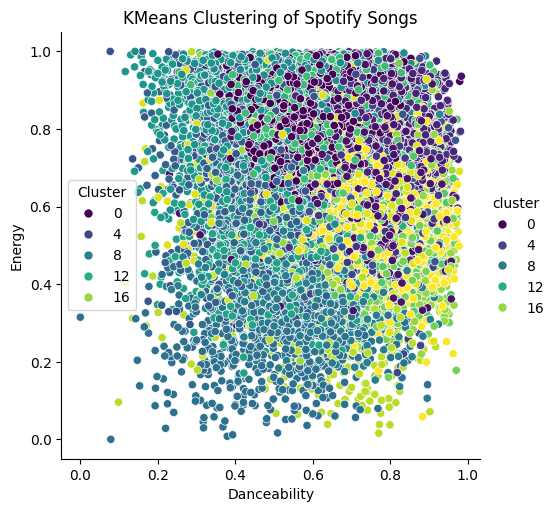

In [396]:
plt.figure(figsize=(10, 6))
sns.relplot(data=df, x='danceability', y='energy', hue='cluster', palette='viridis')
plt.title('KMeans Clustering of Spotify Songs')
plt.xlabel('Danceability')
plt.ylabel('Energy')
plt.legend(title='Cluster')
plt.show()

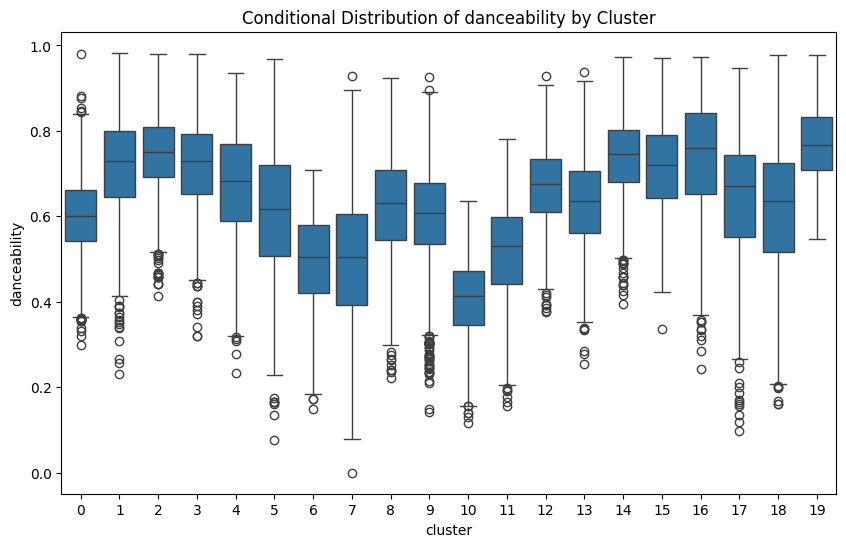

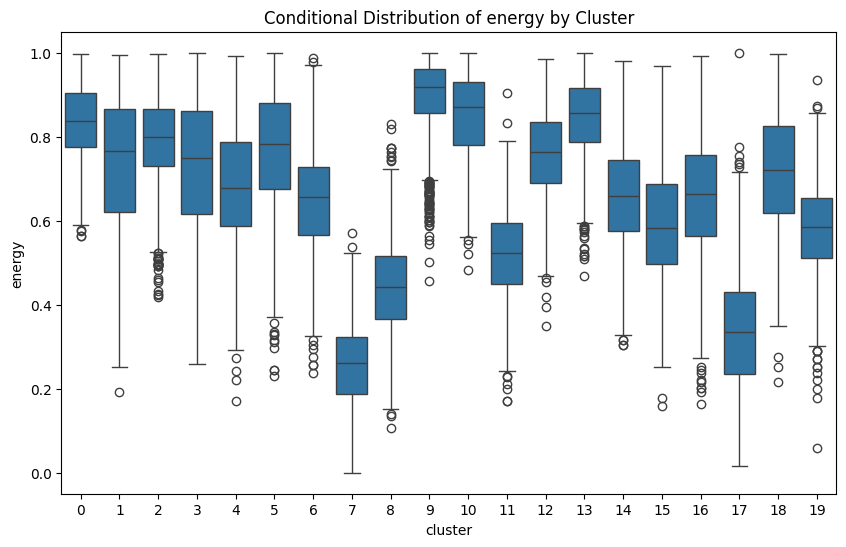

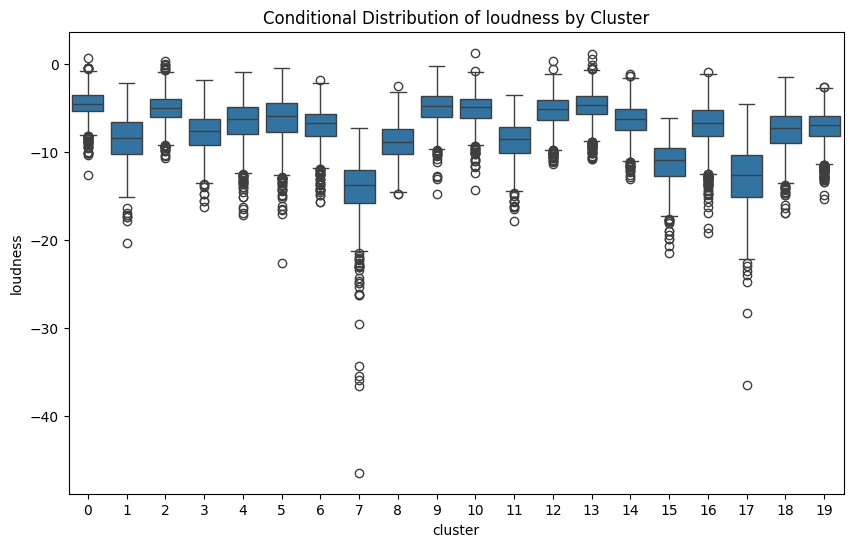

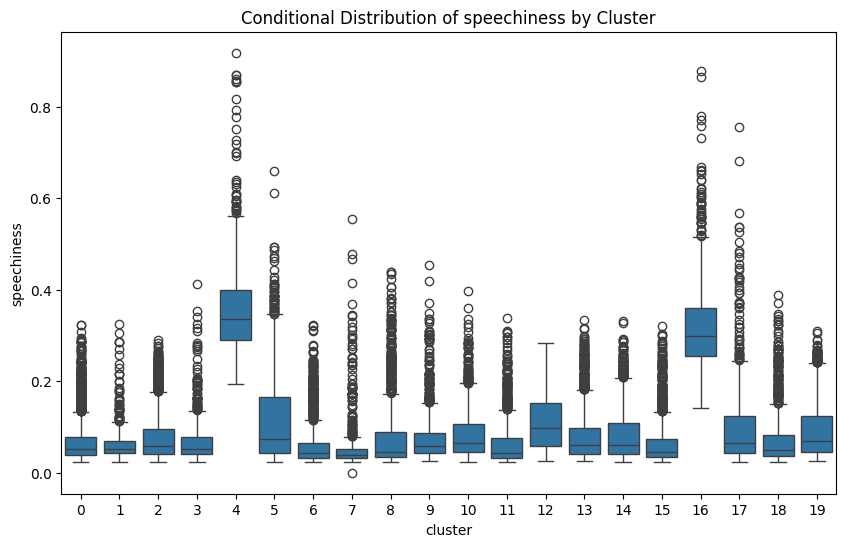

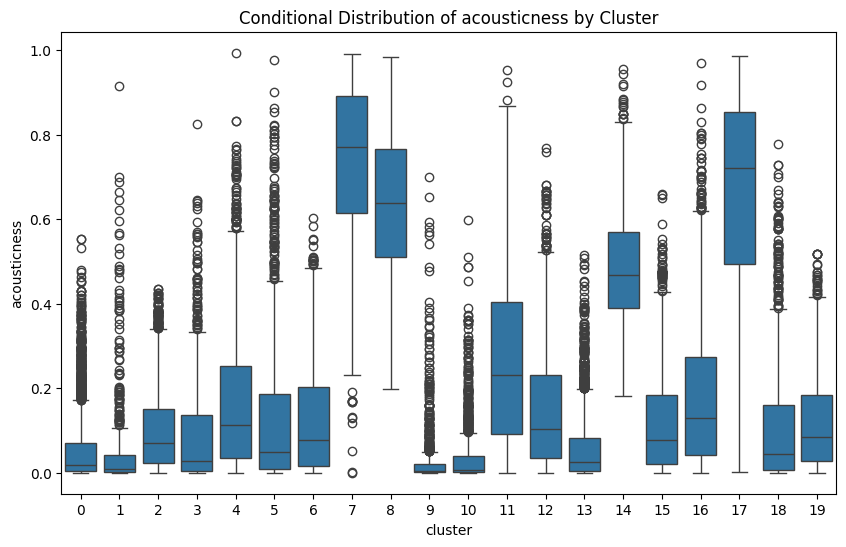

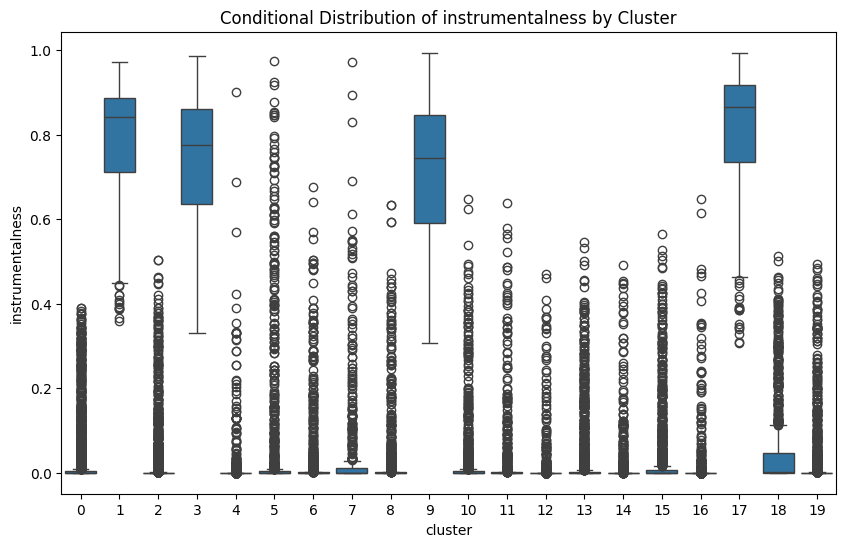

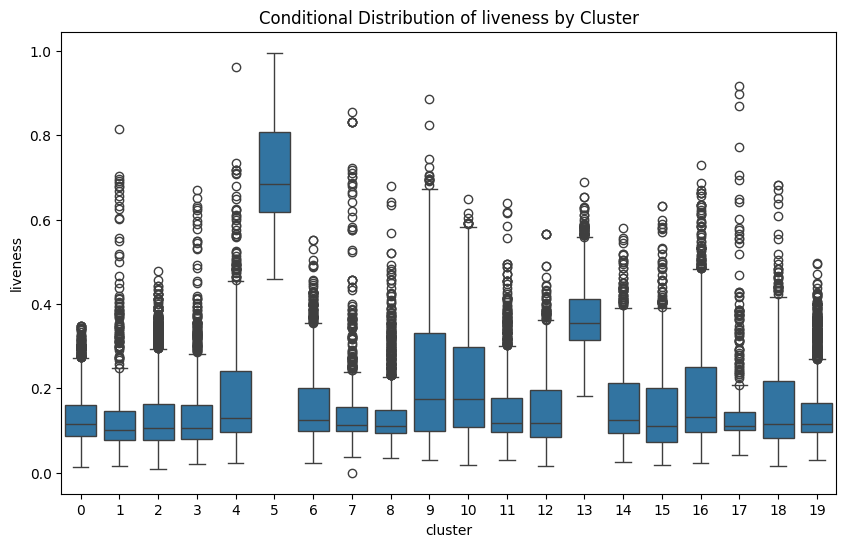

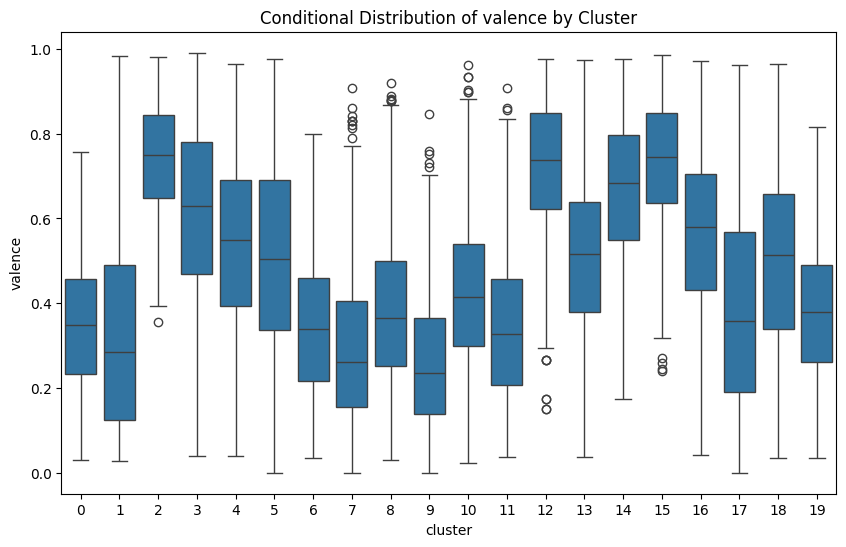

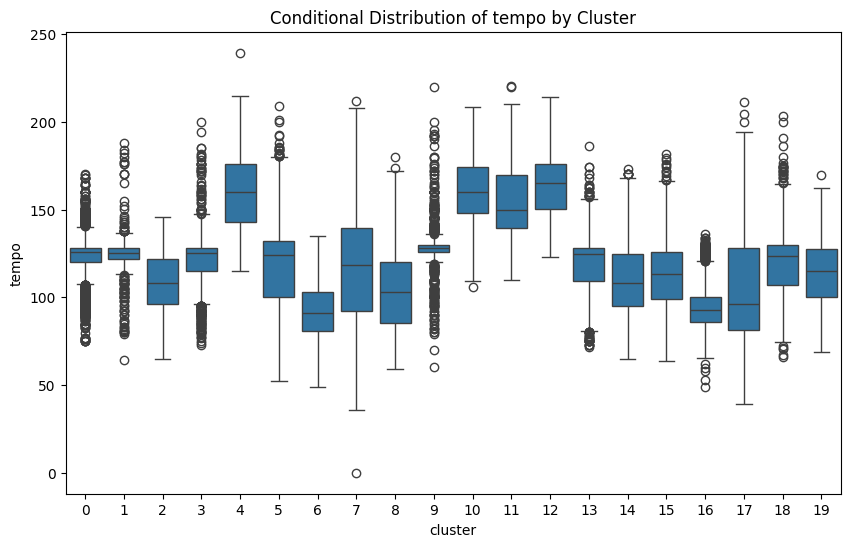

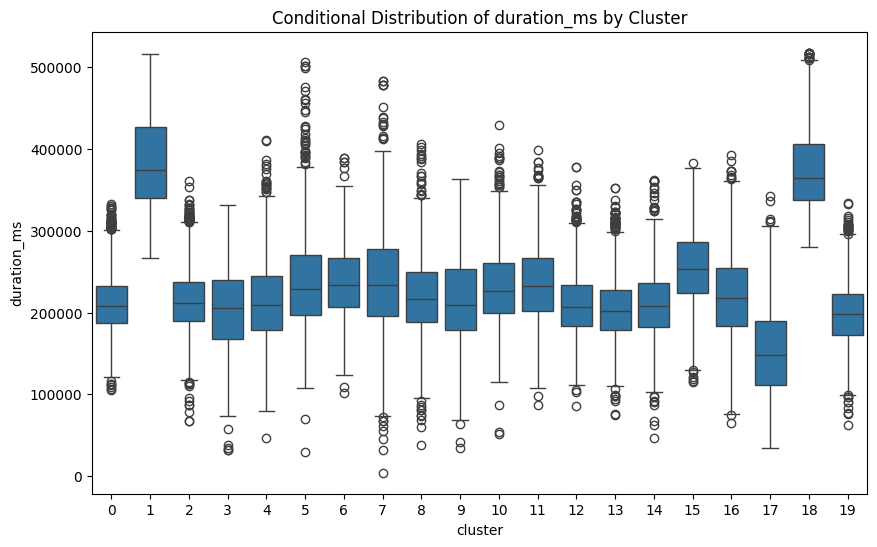

In [400]:
for feature in features:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='cluster', y=feature, data=df)
    plt.title(f'Conditional Distribution of {feature} by Cluster')
    plt.show()

In [402]:
most_popular_song = df.loc[df['track_popularity'].idxmax()]
print("Most Popular Song:")
print(most_popular_song[['track_name', 'track_artist', 'track_popularity', 'cluster']])

Most Popular Song:
track_name          Dance Monkey
track_artist         Tones and I
track_popularity             100
cluster                       14
Name: 1551, dtype: object
